# Lets understand the AI pipeline so far and next <br>
1. We cleaned the dataset. <br>
2. We use HDBSCAN to identify outliers. Input dataset was spatio-temporal, which means it is 3D HDBSCAN, so we identified dense in both space and time, called as Valid cluster and only spatially close but temporally isolated, we called it as a outlier. Output is saved in the csv file.<br>
3. GMM to generate soft clusters, it wants to know 2 things. <br>
---GMM(lat/lon) - For detecting hotspots, regions <br>
---HDBSCAN output - For filtering noise, hotspots. <br>
4. LSTN or GRU - Supervised learning is trained to predict the next cluster based on historical movements. Simple, it combines the identified clusters from GMM with timestamp and taxi.Example sequence for one taxi is, <br>

|Time|cluster ID|
|:----|:----|
|08:00:00|12|
|08:05:00|12|
|08:12:00|45|
|08:25:00|21|
|08:42:00|98|


# Gaussian Mixture Model (GMM) clustering! <br>
-Identify soft clusters based on probabilistic membership <br>
-Usefull for modeling overlapping regions (eg., taxi hotspots) <br>


In [1]:
# !pip install sklearn
# !pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension --sys-prefix
!jupyter nbextension install --py folium --sys-prefix


usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: kernel kernelspec migrate run troubleshoot trust

Jupyter command `jupyter-nbextension` not found.
usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Compu

1.Load HDBSCAN Output (Filtered) & Filter Out Outliers

In [2]:
import pandas as pd

# Load the HDBSCAN output
df = pd.read_csv("D:/Research/Papers/repo/IEEE_SubResizeUsingAIForFleetVehicles/Output/hdbscan_cluster_outliers_20250621_2210.csv")  # update with your file path

# Remove outliers (cluster = -1 or is_outlier = True)
df_clean = df[df['is_outlier'] == False].copy()
df_clean.head(3)

,taxiid,timestamp,longitude,latitude,ts_num,cluster,is_outlier
0,3305,2008-02-02 13:34:25,116.46689,39.99742,1201959265,14,0
1,3305,2008-02-02 13:39:23,116.46693,39.99744,1201959563,14,0
2,3305,2008-02-02 13:39:26,116.46693,39.99744,1201959566,14,0


2. Prepare Feature Matrix for GMM - Use Spatial coordinates.

In [3]:
X = df_clean[['latitude', 'longitude']].values

 4. Choose Optimal Number of Clusters with BIC = Bayesian Information Criterion. <br> 
 **About BIC & AIC:**<br>
 1.It measures how well the model fits the data while penalizing complexity.<br>
 2.Lower BIC = better model (good fit, not too complex).<br>
 3.Without BIC, there is a risk of bad fit, with BIC more reliable clustering. <br>
 4.This helps automatically select how many clusters the GMM should use.
 5.Unlike DBSCAN/HDBSCAN (which automatically infer the number of clusters), GMM requires you to tell it how many Gaussian blobs to fit. 
 6. It's range is (2, 15) for GMM is a practical starting range.

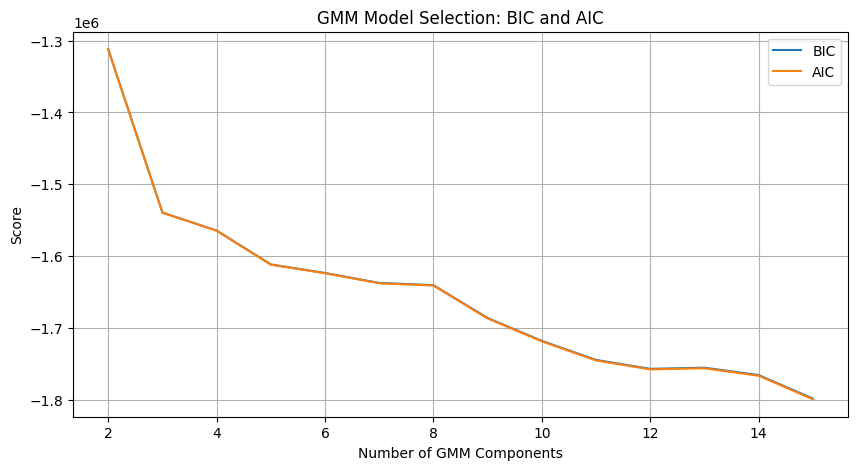

In [4]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

bics = []
aics = []
ks = range(2, 16)

for k in ks:
    gmm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gmm.fit(X)
    bics.append(gmm.bic(X))
    aics.append(gmm.aic(X))

plt.figure(figsize=(10, 5))
plt.plot(ks, bics, label='BIC')
plt.plot(ks, aics, label='AIC')
plt.xlabel('Number of GMM Components')
plt.ylabel('Score')
plt.title('GMM Model Selection: BIC and AIC')
plt.legend()
plt.grid(True)
plt.show()

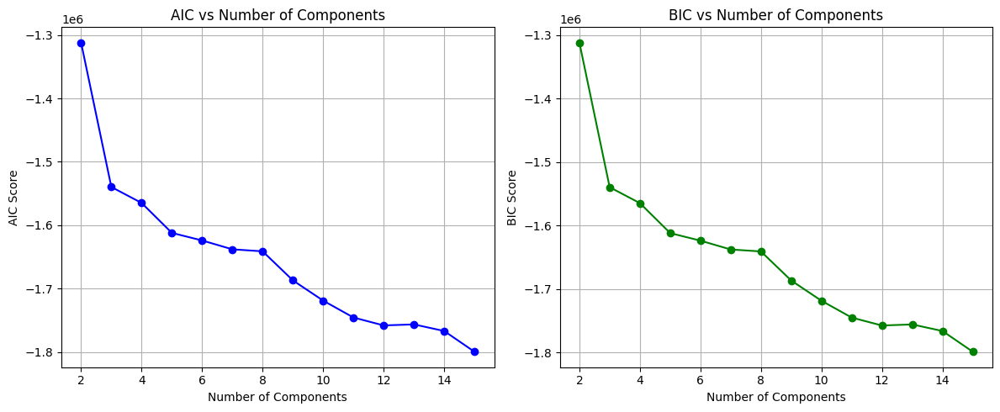

In [5]:
plt.figure(figsize=(12, 5))

# Plot AIC
plt.subplot(1, 2, 1)
plt.plot(ks, aics, marker='o', color='blue')
plt.title('AIC vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('AIC Score')
plt.grid(True)

# Plot BIC
plt.subplot(1, 2, 2)
plt.plot(ks, bics, marker='o', color='green')
plt.title('BIC vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('BIC Score')
plt.grid(True)

plt.tight_layout()
plt.show()

🔎 Observation from AIC & BIC plot: <br>
1.The AIC (Akaike Information Criterion) and BIC (Bayesian Information Criterion) both decrease as the number of GMM components increases from 2 to 15 <br>
🧠 Interpretation: <br>
1.This suggests that the model is fitting better & it is indeed capturing more structure in the data. <br>
📌 What You Should Do Next?
Choose k = 10, Fit Final GMM Model <br>

In [6]:
from sklearn.mixture import GaussianMixture

# Choose your preferred k (e.g., 10)
gmm = GaussianMixture(n_components=10, covariance_type='full', random_state=42)
df_clean['gmm_cluster'] = gmm.fit_predict(X)

In [7]:
df_clean.head(3)

,taxiid,timestamp,longitude,latitude,ts_num,cluster,is_outlier,gmm_cluster
0,3305,2008-02-02 13:34:25,116.46689,39.99742,1201959265,14,0,6
1,3305,2008-02-02 13:39:23,116.46693,39.99744,1201959563,14,0,6
2,3305,2008-02-02 13:39:26,116.46693,39.99744,1201959566,14,0,6


🔹 Step 2: Add Confidence Score

In [8]:
probs = gmm.predict_proba(X)
df_clean['gmm_cluster_confidence'] = probs.max(axis=1)

In [9]:
df_clean.head(3)

,taxiid,timestamp,longitude,latitude,ts_num,cluster,is_outlier,gmm_cluster,gmm_cluster_confidence
0,3305,2008-02-02 13:34:25,116.46689,39.99742,1201959265,14,0,6,0.687577
1,3305,2008-02-02 13:39:23,116.46693,39.99744,1201959563,14,0,6,0.687150
2,3305,2008-02-02 13:39:26,116.46693,39.99744,1201959566,14,0,6,0.687150


🔹 Step 3: Visualize the GMM Clusters

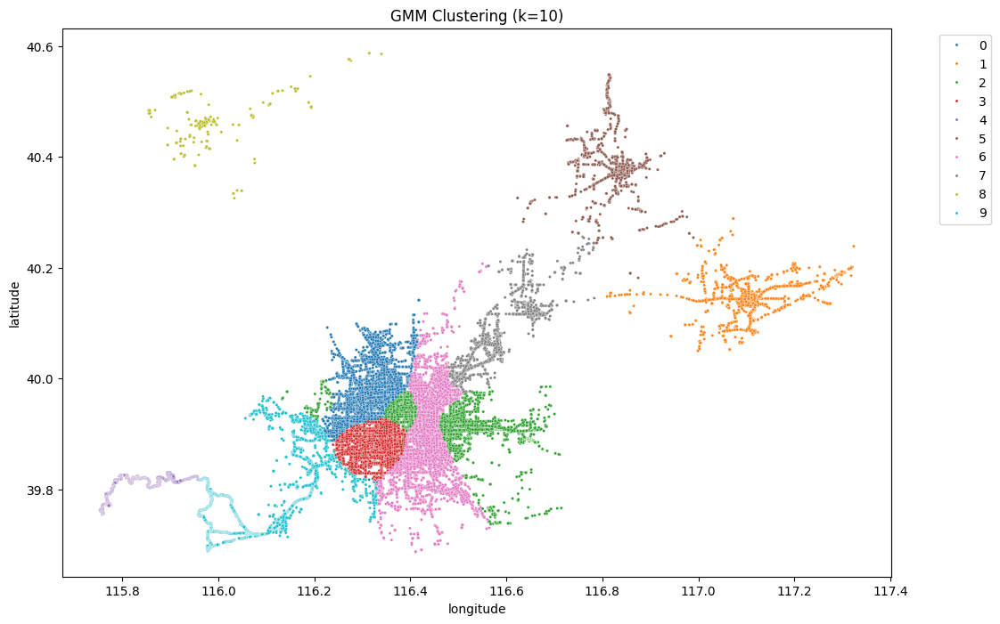

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='longitude', y='latitude',
    hue='gmm_cluster',
    data=df_clean,
    palette='tab10',
    s=5
)
plt.title('GMM Clustering (k=10)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

**📊 GMM Statistics Summary** <br>
1. 📍 Cluster Counts (How many points per cluster) <br>

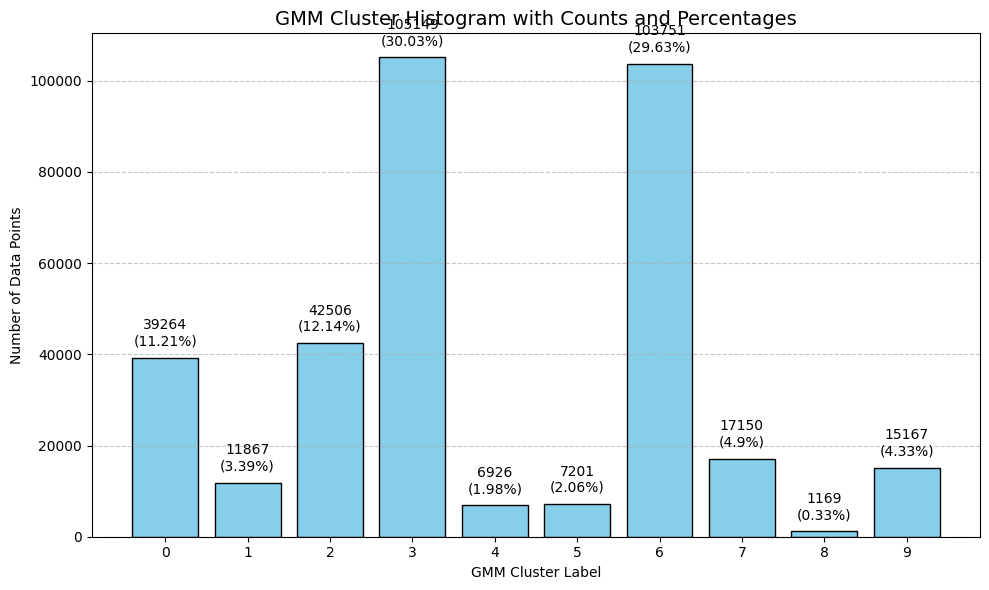

In [11]:
import matplotlib.pyplot as plt

# Compute cluster counts and percentages
cluster_counts = df_clean['gmm_cluster'].value_counts().sort_index()
total_points = cluster_counts.sum()
cluster_percentages = (cluster_counts / total_points * 100).round(2)

# Plotting histogram (bar chart)
plt.figure(figsize=(10, 6))
bars = plt.bar(cluster_counts.index.astype(str), cluster_counts.values, color='skyblue', edgecolor='black')

# Add annotations: count and percentage
for i, (count, pct) in enumerate(zip(cluster_counts.values, cluster_percentages.values)):
    plt.text(i, count + 2000, f"{count}\n({pct}%)", ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title("GMM Cluster Histogram with Counts and Percentages", fontsize=14)
plt.xlabel("GMM Cluster Label")
plt.ylabel("Number of Data Points")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# Summarry <br>
**Cluster Count Interpretation**<br>
|***Cluster Label***|***Number of Points**|***Possible Interpretation***| <br>
0	39,264	Medium-sized spatial region <br>
1	11,867	Small region — possibly a niche hotspot <br>
2	42,506	Medium-large density zone <br>
3	105,149	✅ Largest hotspot, potentially a central or highly trafficked area <br>
4	6,926	Very small zone — might be outlier-ish or rare destination <br>
5	7,201	Similar to cluster 4 <br>
6	103,751	✅ Another major hotspot, close to Cluster 3 <br>
7	17,150	Medium-density zone <br>
8	1,169	⚠️ Very sparse — may include misclassified or marginal data <br>
9	15,167	Mid-small zone, possibly localized activity <br>

🔹 3. Analyze Taxi Distribution per Cluster

C:\Users\uif74417\AppData\Local\Temp\ipykernel_16128\1887388265.py:29: UserWarning: Glyph 128662 (\N{ONCOMING TAXI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\uif74417\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128662 (\N{ONCOMING TAXI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


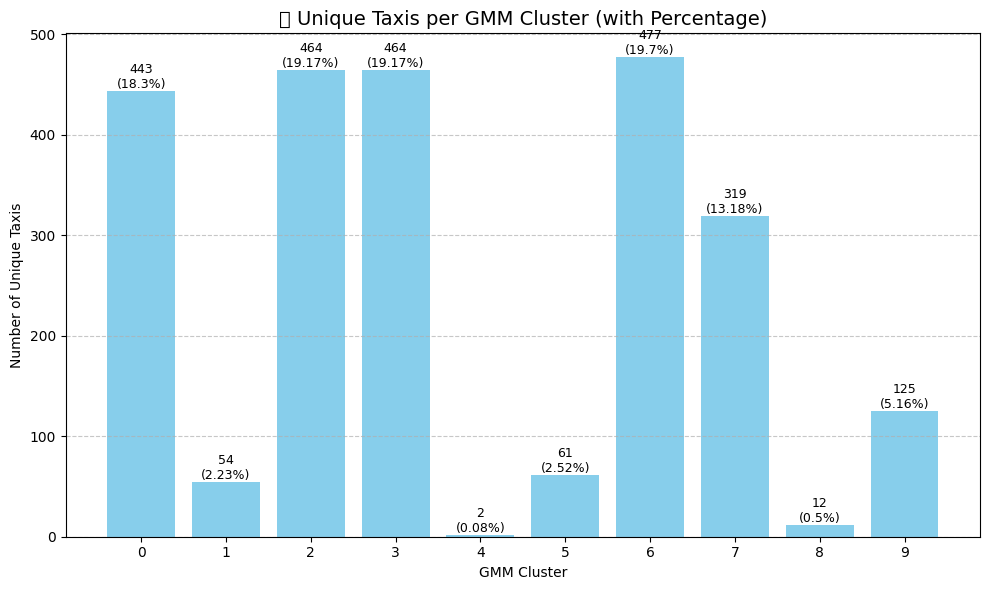

In [12]:
import matplotlib.pyplot as plt

# Calculate unique taxis per cluster
taxi_per_cluster = df_clean.groupby('gmm_cluster')['taxiid'].nunique()
total_unique_taxis = taxi_per_cluster.sum()

# Calculate percentage
taxi_percentage = (taxi_per_cluster / total_unique_taxis * 100).round(2)

# Plot histogram
plt.figure(figsize=(10, 6))
bars = plt.bar(taxi_per_cluster.index.astype(str), taxi_per_cluster.values, color='skyblue')

# Annotate counts and percentage on top of bars
for bar, count, pct in zip(bars, taxi_per_cluster.values, taxi_percentage.values):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{count}\n({pct}%)",
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.title("🚖 Unique Taxis per GMM Cluster (with Percentage)", fontsize=14)
plt.xlabel("GMM Cluster")
plt.ylabel("Number of Unique Taxis")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Visualize GMM Clusters on Interactive Map

In [13]:
import folium
from IPython.display import display

# Center map
center_lat = df_clean['latitude'].mean()
center_lon = df_clean['longitude'].mean()

# Create map with smaller size
m = folium.Map(location=[center_lat, center_lon], zoom_start=11,
               width='700px', height='450px')

# Define 8 cluster colors
colors = ['red', 'blue', 'green', 'orange', 'purple', 'darkred', 'cadetblue', 'darkgreen']
unique_clusters = sorted(df_clean['gmm_cluster'].unique())
color_map = {i: colors[i % len(colors)] for i in unique_clusters}

# Add sample markers per cluster
for cluster_id in unique_clusters:
    sample_data = df_clean[df_clean['gmm_cluster'] == cluster_id].sample(
        n=min(500, df_clean['gmm_cluster'].value_counts()[cluster_id]),
        random_state=42
    )
    
    for _, row in sample_data.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=2,
            color=color_map[cluster_id],
            fill=True,
            fill_color=color_map[cluster_id],
            fill_opacity=0.6,
            weight=0
        ).add_to(m)

# ✅ Add floating HTML legend
legend_html = '''
<div style="
    position: fixed;
    top: 10px; right: 10px; 
    background-color: white;
    border: 1px solid grey;
    padding: 8px;
    font-size: 13px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.3);
    z-index: 1000;
">
<b>GMM Cluster Colors</b><br>
''' + ''.join([
    f'<span style="color:{color_map[i]}">&#9679;</span> Cluster {i}<br>'
    for i in unique_clusters
]) + '</div>'

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
display(m)



Compare the GMM 10 clusters with the Hierarchial clustering 3 macro clusters

In [14]:
import plotly.express as px

# Plot GMM clusters
fig = px.scatter_mapbox(
    df_clean,
    lat='latitude',
    lon='longitude',
    color='gmm_cluster',
    zoom=9,
    mapbox_style='carto-positron',
    title='GMM Clusters (10)',
    height=600
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


C:\Users\uif74417\AppData\Local\Temp\ipykernel_16128\618942901.py:4: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


Save GMM Output to CSV

In [15]:
from datetime import datetime

timestamp = datetime.now().strftime("%Y%m%d_%H%M")
filename = f"D:/Research/Papers/repo/IEEE_SubResizeUsingAIForFleetVehicles/Output/gmm_cluster_output_{timestamp}.csv"
df_clean.to_csv(filename, index=False)

Analyse the confidence

In [16]:
# Threshold (you can adjust this)
confidence_threshold = 0.6

# Count number of low-confidence points
low_conf_points = df_clean[df_clean['gmm_cluster_confidence'] < confidence_threshold]
low_conf_count = len(low_conf_points)
total_points = len(df_clean)

print(f"📉 Number of low-confidence points (< {confidence_threshold}): {low_conf_count}")
print(f"📊 Percentage of low-confidence points: {100 * low_conf_count / total_points:.2f}%")

📉 Number of low-confidence points (< 0.6): 124105
📊 Percentage of low-confidence points: 35.44%
